In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import re
from wordcloud import WordCloud

from ydata_profiling import ProfileReport

%matplotlib inline

pd.options.mode.chained_assignment = None  # default='warn'

# your code that triggers the warning goes here

pd.options.mode.chained_assignment = 'warn'  # set it back to the default value

In [7]:
# Specifying data types for columns while reading a CSV file
dtype_dict = {
    "number": "str",
    "closed": "str", 
    "case": "str",
    "description": "str",
    "case_type": "category",
    "due_date": "str", 
    "first_response_time": "str", 
    "opened": "str",  
    "account": "category",
    "contact": "category",
    "created_by": "category",
    "business_service": "category",
    "business_service_activity": "category",
    "assigned_to": "category",
    "assignment_group": "category",
    "auto_close": "category",
    "time_worked": "float",
    "reassignment_count": "int",
    "impact": "category",
    "priority": "category",
    "urgency": "category",
    "escalation": "category",
    "comments": "str",
    "case_cause": "category",
    "cause": "str",
    "close_notes": "str",
    "resolution_code": "category",
    "problem": "category",
    "business_percentage": "float",
    "sla_has_breached": "category",
    "duration": "float",
    "openedToClosed": "float",
    "created_by_group": "category",
    "cluster": "int" 
}

# read csv file into dataframe
df1 = pd.read_csv('Data/data_withclusters.csv', dtype = dtype_dict)
df2 = pd.read_csv('Data/data.csv', dtype = dtype_dict)


# only remain description, cause and close_notes columns
df2 = df2[['description', 'cause', 'close_notes']]

# concatenate two dataframes
df = pd.concat([df1, df2], axis=1)



# print shape of dataframe 
print(df.shape)
print(df.columns)
display(df)

(11746, 17)
Index(['number', 'account', 'created_by_group', 'business_service', 'impact',
       'priority', 'urgency', 'sla_has_breached', 'opened', 'closed',
       'time_worked', 'openedToClosed', 'business_percentage', 'cluster',
       'description', 'cause', 'close_notes'],
      dtype='object')


,number,account,created_by_group,business_service,impact,priority,urgency,sla_has_breached,opened,closed,time_worked,openedToClosed,business_percentage,cluster,description,cause,close_notes
0,CS0011381,Saphir Group Networks AG,Unico,Managed Workplace,3 - Low,4 - Low,2 - Medium,TRUE,2020-01-09 15:32:00,2020-05-18 19:10:46,0.0,1239.560833,105.6200,3,Hallo Nathanael\r\n\r\nNur so zur Info mein No...,Workaround mit Windows Energy Einstellungen (K...,Workaround mit Windows Energy Einstellungen (K...
1,CS0011690,GASSMANN Rechtsanwälte AG,Unico,Hosted Desktop,3 - Low,5 - Planning,3 - Low,TRUE,2020-01-16 08:19:12,2020-08-19 10:30:06,0.0,1239.560833,285.0625,3,Suche in Archive -> Erweiterte Suche -> Archi...,NaN,Archiv wie gewünscht konfiguriert
2,CS0011797,Siloah AG,Unico,Hosted Desktop,3 - Low,3 - Moderate,1 - High,TRUE,2020-01-20 12:26:23,2020-05-18 19:10:48,0.0,1239.560833,285.0625,3,Wenn es etwas neues gibt bitte Herr Thomann pe...,NaN,gemäss Telefon mit Sandro Borer ist die Perfor...
3,CS0011896,Interhydro AG,Unico,No Business Service - only best effort service,3 - Low,5 - Planning,3 - Low,TRUE,2020-01-21 18:18:46,2020-06-23 14:51:27,900.0,1239.560833,208.9600,3,'Microsoft Hyper-V VSS Writer' writer status i...,Wechsel auf Altaro,Wechsel auf Altaro
4,CS0012000,Verband Regionaler SD Münchenbuchsee,User,No Business Service - only best effort service,3 - Low,4 - Low,2 - Medium,TRUE,2020-01-23 17:09:10,2020-05-18 19:10:49,0.0,1239.560833,285.0625,3,Guten Tag\r\nBeim Verwenden des PayPen kommt i...,Sage empfiehlt direkt mit dem Hersteller des P...,Guten Tag Frau Bär\r\r\n\r\r\nVielen Dank für ...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11741,CS0076818,Siloah AG,Unico,Anmeldeprobleme auf Hosted Desktop beheben (Pa...,2 - Medium,3 - Moderate,2 - Medium,FALSE,2024-02-10 07:48:59,2024-02-19 22:30:09,2700.0,230.686111,0.0100,1,Frau Luana Filippi kann sich in der VDI mit de...,Probleme mit Citrix Workspace App.,Workaround-Lösung implementiert. Login via Bro...
11742,CS0076821,Siloah AG,Unico,Übrige Störungen und Anfragen Hosted Desktop,2 - Medium,3 - Moderate,2 - Medium,FALSE,2024-02-12 05:57:13,2024-02-19 22:30:10,3240.0,184.549167,4.5900,1,NaN,unbekannt,neustart des Druckers und überprüfung der Netz...
11743,CS0076822,PB Swiss Tools,Unico,Session freigeben in Hosted Desktop,2 - Medium,3 - Moderate,2 - Medium,FALSE,2024-02-12 06:06:02,2024-02-19 22:30:10,900.0,184.402222,1.8000,1,NaN,"blockierte Session auf dem Server Staus ""Loggi...",Session auf dem Server geschlossen - danach ka...
11744,CS0076849,Siloah AG,Unico,Applikationsstörung (Standard Applikation) beh...,2 - Medium,3 - Moderate,2 - Medium,FALSE,2024-02-12 13:08:42,2024-02-19 22:30:14,720.0,177.358889,0.0400,1,Nach dem Beheben von Outlookprobleme fehlte de...,Wurde beim vorderen Case nicht wieder verknüpf...,Archivorder aus dem Laufwerk H:\Outlook ordner...


Cluster 3


c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\ydata_profiling\utils\dataframe.py:137: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.rename(columns={"index": "df_index"}, inplace=True)


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\ydata_profiling\model\pandas\discretize_pandas.py:52: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[4 4 4 ... 4 4 4]' has dtype incompatible with int32, please explicitly cast to a compatible dtype first.
  discretized_df.loc[:, column] = self._discretize_column(
c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\ydata_profiling\model\correlations.py:66: UserWarning: There was an attempt to calculate the auto correlation, but this failed.
To hide this warning, disable the calculation
(using `df.profile_report(correlations={"auto": {"calculate": False}})`
If this is problematic for your use case, please report this as an issue:
https://github.com/ydataai/ydata-profiling/issues
(include the error message: 'could not convert string to float: 'Saphir Group Networks AG'')
  warnings.warn(
c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-pac

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Cluster 2


c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\ydata_profiling\utils\dataframe.py:137: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.rename(columns={"index": "df_index"}, inplace=True)


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\ydata_profiling\model\pandas\discretize_pandas.py:52: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[4 4 4 ... 4 4 4]' has dtype incompatible with int32, please explicitly cast to a compatible dtype first.
  discretized_df.loc[:, column] = self._discretize_column(
c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\ydata_profiling\model\correlations.py:66: UserWarning: There was an attempt to calculate the auto correlation, but this failed.
To hide this warning, disable the calculation
(using `df.profile_report(correlations={"auto": {"calculate": False}})`
If this is problematic for your use case, please report this as an issue:
https://github.com/ydataai/ydata-profiling/issues
(include the error message: 'could not convert string to float: 'Schilthornbahn AG'')
  warnings.warn(
c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\s

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Cluster 1


c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\ydata_profiling\utils\dataframe.py:137: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.rename(columns={"index": "df_index"}, inplace=True)


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\ydata_profiling\model\pandas\discretize_pandas.py:52: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[4 4 4 ... 4 4 4]' has dtype incompatible with int32, please explicitly cast to a compatible dtype first.
  discretized_df.loc[:, column] = self._discretize_column(
c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\ydata_profiling\model\correlations.py:66: UserWarning: There was an attempt to calculate the auto correlation, but this failed.
To hide this warning, disable the calculation
(using `df.profile_report(correlations={"auto": {"calculate": False}})`
If this is problematic for your use case, please report this as an issue:
https://github.com/ydataai/ydata-profiling/issues
(include the error message: 'could not convert string to float: 'Siloah AG'')
  warnings.warn(
c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\seaborn\m

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

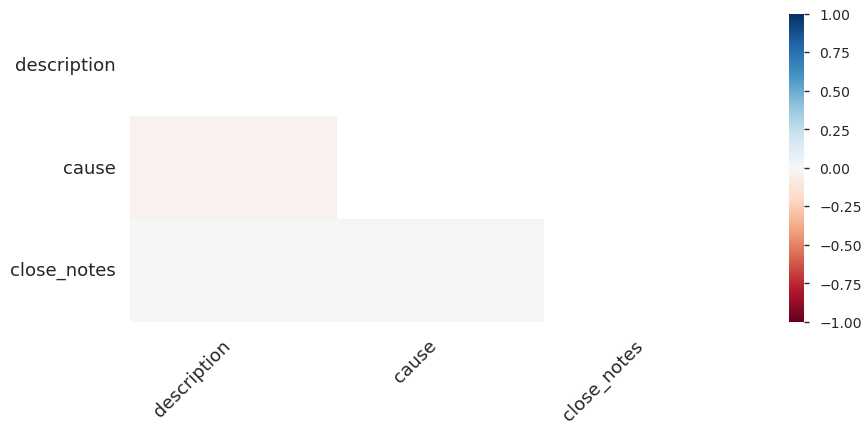

In [8]:
# For each Cluster to a Profile Report
for cluster in df['cluster'].unique():
    print(f"Cluster {cluster}")
    profile = ProfileReport(df[df['cluster'] == cluster], title=f"Profiling Report for Cluster {cluster}")
    profile.to_file(f"./html/Profiling Report for Cluster {cluster}.html")

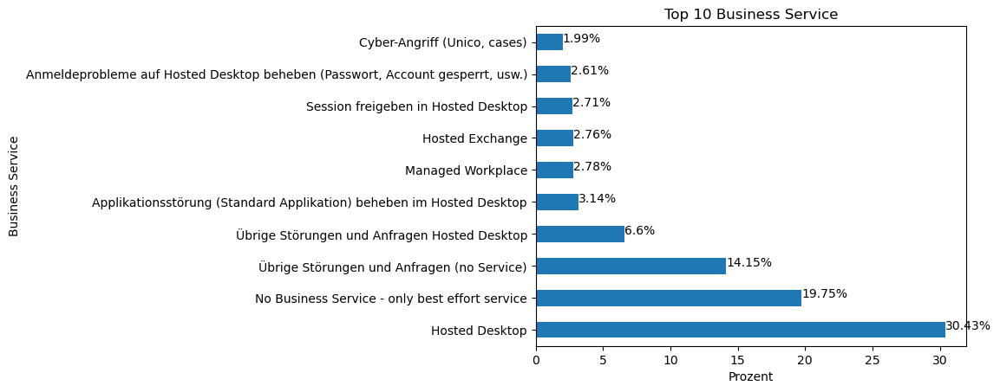

In [9]:
(df["business_service"].value_counts() / len(df) * 100).head(10).plot(kind = "barh")
# add procent value to bar
for index, value in enumerate((df["business_service"].value_counts() / len(df) * 100).head(10)):
    plt.text(value, index, str(round(value, 2)) + '%')
plt.title("Top 10 Business Service")
plt.xlabel("Prozent")
plt.ylabel("Business Service")
plt.show()

In [10]:
# display Short Description (case), Description, Cause and close_notes
df_text = df[['description', 'cause', 'close_notes']]

# preprocess df_text columns 

display(df_text)

,description,cause,close_notes
0,Hallo Nathanael\r\n\r\nNur so zur Info mein No...,Workaround mit Windows Energy Einstellungen (K...,Workaround mit Windows Energy Einstellungen (K...
1,Suche in Archive -> Erweiterte Suche -> Archi...,NaN,Archiv wie gewünscht konfiguriert
2,Wenn es etwas neues gibt bitte Herr Thomann pe...,NaN,gemäss Telefon mit Sandro Borer ist die Perfor...
3,'Microsoft Hyper-V VSS Writer' writer status i...,Wechsel auf Altaro,Wechsel auf Altaro
4,Guten Tag\r\nBeim Verwenden des PayPen kommt i...,Sage empfiehlt direkt mit dem Hersteller des P...,Guten Tag Frau Bär\r\r\n\r\r\nVielen Dank für ...
...,...,...,...
11741,Frau Luana Filippi kann sich in der VDI mit de...,Probleme mit Citrix Workspace App.,Workaround-Lösung implementiert. Login via Bro...
11742,NaN,unbekannt,neustart des Druckers und überprüfung der Netz...
11743,NaN,"blockierte Session auf dem Server Staus ""Loggi...",Session auf dem Server geschlossen - danach ka...
11744,Nach dem Beheben von Outlookprobleme fehlte de...,Wurde beim vorderen Case nicht wieder verknüpf...,Archivorder aus dem Laufwerk H:\Outlook ordner...


In [11]:
def process_captions(data, column):
    data[column] = data[column].apply(lambda x: x.replace('\n', ' '))
    data[column] = data[column].apply(lambda x: x.replace('-', ' '))
    data[column] = data[column].apply(lambda x: x.lower())
    data[column] = data[column].apply(lambda x: re.sub('[^a-zA-Z0-9\s]', ' ', x))
    return data[column]

# change datatype of columns to string
df_text['description'] = df_text['description'].astype(str).copy()
df_text['cause'] = df_text['cause'].astype(str).copy()
df_text['close_notes'] = df_text['close_notes'].astype(str).copy()

df_text['description'] = process_captions(df_text, 'description').copy()
df_text['cause'] = process_captions(df_text, 'cause').copy()
df_text['close_notes'] = process_captions(df_text, 'close_notes').copy()

display(df_text)

C:\Users\Student\AppData\Local\Temp\ipykernel_9316\2137834646.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_text['description'] = df_text['description'].astype(str).copy()
C:\Users\Student\AppData\Local\Temp\ipykernel_9316\2137834646.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_text['cause'] = df_text['cause'].astype(str).copy()
C:\Users\Student\AppData\Local\Temp\ipykernel_9316\2137834646.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.


,description,cause,close_notes
0,hallo nathanael\r \r nur so zur info mein note...,workaround mit windows energy einstellungen k...,workaround mit windows energy einstellungen k...
1,suche in archive erweiterte suche archi...,nan,archiv wie gew nscht konfiguriert
2,wenn es etwas neues gibt bitte herr thomann pe...,nan,gem ss telefon mit sandro borer ist die perfor...
3,microsoft hyper v vss writer writer status i...,wechsel auf altaro,wechsel auf altaro
4,guten tag\r beim verwenden des paypen kommt im...,sage empfiehlt direkt mit dem hersteller des p...,guten tag frau b r\r\r \r\r vielen dank f r ih...
...,...,...,...
11741,frau luana filippi kann sich in der vdi mit de...,probleme mit citrix workspace app,workaround l sung implementiert login via bro...
11742,nan,unbekannt,neustart des druckers und berpr fung der netz...
11743,nan,blockierte session auf dem server staus loggi...,session auf dem server geschlossen danach ka...
11744,nach dem beheben von outlookprobleme fehlte de...,wurde beim vorderen case nicht wieder verkn pf...,archivorder aus dem laufwerk h outlook ordner...


In [12]:
import requests

stopwords = requests.get("https://raw.githubusercontent.com/stopwords-iso/stopwords-de/master/stopwords-de.txt").text.split("\n")
stopwords.extend(["nan", "frau", "herr", "ch", "bitte", "st"])
from sklearn.feature_extraction.text import TfidfVectorizer

tfidf = TfidfVectorizer(stop_words=stopwords)
tfidf.fit(df_text['description'])
tfidf.fit(df_text['cause'])
tfidf.fit(df_text['close_notes'])

TfidfVectorizer(stop_words=['a', 'ab', 'aber', 'ach', 'acht', 'achte', 'achten',
                            'achter', 'achtes', 'ag', 'alle', 'allein', 'allem',
                            'allen', 'aller', 'allerdings', 'alles',
                            'allgemeinen', 'als', 'also', 'am', 'an', 'ander',
                            'andere', 'anderem', 'anderen', 'anderer',
                            'anderes', 'anderm', 'andern', ...])

In [13]:
# create tfidf.vocabulary_ into a dataframe 
df_tfidf = pd.DataFrame.from_dict(tfidf.vocabulary_, orient="index")
df_tfidf.sort_values(by=0, ascending=False)

index_dict = {v: k for k, v in tfidf.vocabulary_.items()}


df_tfidf = df_tfidf.reset_index()
df_tfidf.columns = ["word", "index"]
df_tfidf

top_words_i_list = []

num_top_words = 10
import tqdm
from tqdm import tqdm

for i, row in tqdm(df_text.iterrows()):

    #print("")
    #print("Ticket", i+1)
    #print("Top words per document:")
    # extract indices of top words
    top_words = sorted(
        list(enumerate(tfidf.transform([row["description"]]).toarray()[0])),
        key=lambda x: x[1],
        reverse=True,
    )[:num_top_words]

    # create empty list to store top words 
    top_words_i = []
    # print top words
    for word_index, word_score in top_words:
        #print(index_dict[word_index])
        top_words_i.append(index_dict[word_index])
    
    # append top words to top_words_i_list
    top_words_i_list.append(top_words_i)

    # break to only print first ticket
    #break

11746it [01:43, 113.11it/s]


In [14]:
top_words_i_list[:10]

[['ruhe',
  'gelegenheit',
  'nathanael',
  'lg',
  'martin',
  'passiert',
  'anschauen',
  'danke',
  'info',
  'hallo'],
 ['erweiterte',
  'archiv',
  'tab',
  'screenshot',
  'hilfe',
  'siehe',
  'einstellungen',
  'mail',
  '00',
  '000'],
 ['thomann',
  'mail',
  'informieren',
  'siloah',
  'per',
  'neues',
  '00',
  '000',
  '0000',
  '00000002'],
 ['writer',
  'event',
  'invalid',
  'more',
  'see',
  'again',
  'hyper',
  'state',
  'or',
  'is'],
 ['paypen',
  'eveline',
  'help',
  'konfigurieren',
  'sage',
  'verwenden',
  'anleitung',
  'online',
  'fehlermeldung',
  'freundliche'],
 ['sitzung',
  'ro',
  'problematik',
  'auszuschliessen',
  'problembeschrieb',
  'angegangen',
  'jedenfalls',
  'netzwerkproblem',
  'eruiert',
  'ckzuf'],
 ['riggli',
  'ubiquiti',
  'schi',
  'jeweils',
  'swi',
  'schaffen',
  'folge',
  'mindestens',
  'mittag',
  'abhilfe'],
 ['manchmal',
  'bereich',
  'chrome',
  'browser',
  'adressleiste',
  'beispielsweise',
  'favoritenleiste

In [15]:
df_top_words = pd.DataFrame(columns=["top_10_words_each_ticket_description"])

df_top_words["top_10_words_each_ticket_description"] = top_words_i_list

df_top_words.reset_index(inplace=True)

display(df_top_words)

# rename columns
df_top_words.columns = ["number", "top_10_words_each_ticket_description"]

display(df_top_words)

,index,top_10_words_each_ticket_description
0,0,"[ruhe, gelegenheit, nathanael, lg, martin, pas..."
1,1,"[erweiterte, archiv, tab, screenshot, hilfe, s..."
2,2,"[thomann, mail, informieren, siloah, per, neue..."
3,3,"[writer, event, invalid, more, see, again, hyp..."
4,4,"[paypen, eveline, help, konfigurieren, sage, v..."
...,...,...
11741,11741,"[meldung, verbindung, anmelden, glich, app, wo..."
11742,11742,"[00, 000, 0000, 00000002, 0000046d, 0000c246, ..."
11743,11743,"[00, 000, 0000, 00000002, 0000046d, 0000c246, ..."
11744,11744,"[archiv, fehlte, beheben, ordner, 00, 000, 000..."


,number,top_10_words_each_ticket_description
0,0,"[ruhe, gelegenheit, nathanael, lg, martin, pas..."
1,1,"[erweiterte, archiv, tab, screenshot, hilfe, s..."
2,2,"[thomann, mail, informieren, siloah, per, neue..."
3,3,"[writer, event, invalid, more, see, again, hyp..."
4,4,"[paypen, eveline, help, konfigurieren, sage, v..."
...,...,...
11741,11741,"[meldung, verbindung, anmelden, glich, app, wo..."
11742,11742,"[00, 000, 0000, 00000002, 0000046d, 0000c246, ..."
11743,11743,"[00, 000, 0000, 00000002, 0000046d, 0000c246, ..."
11744,11744,"[archiv, fehlte, beheben, ordner, 00, 000, 000..."


In [16]:
# concat df with df_top_words["top_10_words_each_ticket"]
df_enhance = pd.concat([df, df_top_words["top_10_words_each_ticket_description"]], axis=1)
display(df_enhance)

,number,account,created_by_group,business_service,impact,priority,urgency,sla_has_breached,opened,closed,time_worked,openedToClosed,business_percentage,cluster,description,cause,close_notes,top_10_words_each_ticket_description
0,CS0011381,Saphir Group Networks AG,Unico,Managed Workplace,3 - Low,4 - Low,2 - Medium,TRUE,2020-01-09 15:32:00,2020-05-18 19:10:46,0.0,1239.560833,105.6200,3,Hallo Nathanael\r\n\r\nNur so zur Info mein No...,Workaround mit Windows Energy Einstellungen (K...,Workaround mit Windows Energy Einstellungen (K...,"[ruhe, gelegenheit, nathanael, lg, martin, pas..."
1,CS0011690,GASSMANN Rechtsanwälte AG,Unico,Hosted Desktop,3 - Low,5 - Planning,3 - Low,TRUE,2020-01-16 08:19:12,2020-08-19 10:30:06,0.0,1239.560833,285.0625,3,Suche in Archive -> Erweiterte Suche -> Archi...,NaN,Archiv wie gewünscht konfiguriert,"[erweiterte, archiv, tab, screenshot, hilfe, s..."
2,CS0011797,Siloah AG,Unico,Hosted Desktop,3 - Low,3 - Moderate,1 - High,TRUE,2020-01-20 12:26:23,2020-05-18 19:10:48,0.0,1239.560833,285.0625,3,Wenn es etwas neues gibt bitte Herr Thomann pe...,NaN,gemäss Telefon mit Sandro Borer ist die Perfor...,"[thomann, mail, informieren, siloah, per, neue..."
3,CS0011896,Interhydro AG,Unico,No Business Service - only best effort service,3 - Low,5 - Planning,3 - Low,TRUE,2020-01-21 18:18:46,2020-06-23 14:51:27,900.0,1239.560833,208.9600,3,'Microsoft Hyper-V VSS Writer' writer status i...,Wechsel auf Altaro,Wechsel auf Altaro,"[writer, event, invalid, more, see, again, hyp..."
4,CS0012000,Verband Regionaler SD Münchenbuchsee,User,No Business Service - only best effort service,3 - Low,4 - Low,2 - Medium,TRUE,2020-01-23 17:09:10,2020-05-18 19:10:49,0.0,1239.560833,285.0625,3,Guten Tag\r\nBeim Verwenden des PayPen kommt i...,Sage empfiehlt direkt mit dem Hersteller des P...,Guten Tag Frau Bär\r\r\n\r\r\nVielen Dank für ...,"[paypen, eveline, help, konfigurieren, sage, v..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11741,CS0076818,Siloah AG,Unico,Anmeldeprobleme auf Hosted Desktop beheben (Pa...,2 - Medium,3 - Moderate,2 - Medium,FALSE,2024-02-10 07:48:59,2024-02-19 22:30:09,2700.0,230.686111,0.0100,1,Frau Luana Filippi kann sich in der VDI mit de...,Probleme mit Citrix Workspace App.,Workaround-Lösung implementiert. Login via Bro...,"[meldung, verbindung, anmelden, glich, app, wo..."
11742,CS0076821,Siloah AG,Unico,Übrige Störungen und Anfragen Hosted Desktop,2 - Medium,3 - Moderate,2 - Medium,FALSE,2024-02-12 05:57:13,2024-02-19 22:30:10,3240.0,184.549167,4.5900,1,NaN,unbekannt,neustart des Druckers und überprüfung der Netz...,"[00, 000, 0000, 00000002, 0000046d, 0000c246, ..."
11743,CS0076822,PB Swiss Tools,Unico,Session freigeben in Hosted Desktop,2 - Medium,3 - Moderate,2 - Medium,FALSE,2024-02-12 06:06:02,2024-02-19 22:30:10,900.0,184.402222,1.8000,1,NaN,"blockierte Session auf dem Server Staus ""Loggi...",Session auf dem Server geschlossen - danach ka...,"[00, 000, 0000, 00000002, 0000046d, 0000c246, ..."
11744,CS0076849,Siloah AG,Unico,Applikationsstörung (Standard Applikation) beh...,2 - Medium,3 - Moderate,2 - Medium,FALSE,2024-02-12 13:08:42,2024-02-19 22:30:14,720.0,177.358889,0.0400,1,Nach dem Beheben von Outlookprobleme fehlte de...,Wurde beim vorderen Case nicht wieder verknüpf...,Archivorder aus dem Laufwerk H:\Outlook ordner...,"[archiv, fehlte, beheben, ordner, 00, 000, 000..."


In [17]:
vorcab = np.array(df_enhance["top_10_words_each_ticket_description"].to_list()).reshape(-1, 1)
print(vorcab)

# convert into datafarme
df_vorcab = pd.DataFrame(vorcab)
df_vorcab.columns = ["top_10_words_each_ticket_description"]
display(df_vorcab)

# count values
df_vorcab["top_10_words_each_ticket_description"].value_counts().head(50)

[['ruhe']
 ['gelegenheit']
 ['nathanael']
 ...
 ['0000046d']
 ['0000c246']
 ['001']]


,top_10_words_each_ticket_description
0,ruhe
1,gelegenheit
2,nathanael
3,lg
4,martin
...,...
117455,0000
117456,00000002
117457,0000046d
117458,0000c246


top_10_words_each_ticket_description
00               7334
000              6781
0000             6187
00000002         5489
0000046d         4748
0000c246         3875
001              3001
0010             2168
002              1626
003001           1449
vdi               803
fehlermeldung     598
meldet            556
funktioniert      519
41                512
desktop           456
anmelden          453
gemeldet          426
outlook           422
drucker           390
angerufen         375
starten           340
citrix            326
name              315
gestartet         311
verbindung        305
passwort          303
meldung           297
user              293
login             280
probleme          272
session           268
siloah            265
priority          265
gesperrt          258
anmeldung         253
titel             244
031               242
erscheint         242
mail              239
angezeigt         236
server            234
problem           233
glich            

In [18]:
important_words_df = pd.DataFrame(df_vorcab["top_10_words_each_ticket_description"].value_counts()).reset_index()  

df_top = df['number']
top50words = important_words_df.index[:50].tolist()

# onehot encoding df_enhance["top_10_words_each_ticket"] with top50words
for word in top50words:

    df_enhance[word] = df_enhance["top_10_words_each_ticket_description"].apply(lambda x: 1 if word in x else 0)

display(df_enhance.head(10))

,number,account,created_by_group,business_service,impact,priority,urgency,sla_has_breached,opened,closed,...,40,41,42,43,44,45,46,47,48,49
0,CS0011381,Saphir Group Networks AG,Unico,Managed Workplace,3 - Low,4 - Low,2 - Medium,TRUE,2020-01-09 15:32:00,2020-05-18 19:10:46,...,0,0,0,0,0,0,0,0,0,0
1,CS0011690,GASSMANN Rechtsanwälte AG,Unico,Hosted Desktop,3 - Low,5 - Planning,3 - Low,TRUE,2020-01-16 08:19:12,2020-08-19 10:30:06,...,0,0,0,0,0,0,0,0,0,0
2,CS0011797,Siloah AG,Unico,Hosted Desktop,3 - Low,3 - Moderate,1 - High,TRUE,2020-01-20 12:26:23,2020-05-18 19:10:48,...,0,0,0,0,0,0,0,0,0,0
3,CS0011896,Interhydro AG,Unico,No Business Service - only best effort service,3 - Low,5 - Planning,3 - Low,TRUE,2020-01-21 18:18:46,2020-06-23 14:51:27,...,0,0,0,0,0,0,0,0,0,0
4,CS0012000,Verband Regionaler SD Münchenbuchsee,User,No Business Service - only best effort service,3 - Low,4 - Low,2 - Medium,TRUE,2020-01-23 17:09:10,2020-05-18 19:10:49,...,0,0,0,0,0,0,0,0,0,0
5,CS0012311,Schilthornbahn AG,Unico,No Business Service - only best effort service,3 - Low,4 - Low,2 - Medium,FALSE,2020-01-31 12:52:33,2020-10-09 06:50:32,...,0,0,0,0,0,0,0,0,0,0
6,CS0012381,Schilthornbahn AG,Unico,No Business Service - only best effort service,3 - Low,4 - Low,2 - Medium,FALSE,2020-02-03 09:29:37,2020-07-14 10:30:05,...,0,0,0,0,0,0,0,0,0,0
7,CS0012457,Shoppi Tivoli Management AG,Unico,Hosted Desktop,3 - Low,4 - Low,2 - Medium,TRUE,2020-02-04 07:19:20,2020-02-14 07:45:20,...,0,0,0,0,0,0,0,0,0,0
8,CS0012461,SAHB,Unico,Hosted Desktop,3 - Low,4 - Low,2 - Medium,FALSE,2020-02-04 08:07:51,2020-02-04 08:09:36,...,0,0,0,0,0,0,0,0,0,0
9,CS0012477,Unico Treuhand AG,Unico,Hosted Desktop,3 - Low,5 - Planning,3 - Low,FALSE,2020-02-04 10:18:21,2020-04-08 14:41:40,...,0,0,0,0,0,0,0,0,0,0


Top20 words for business_service


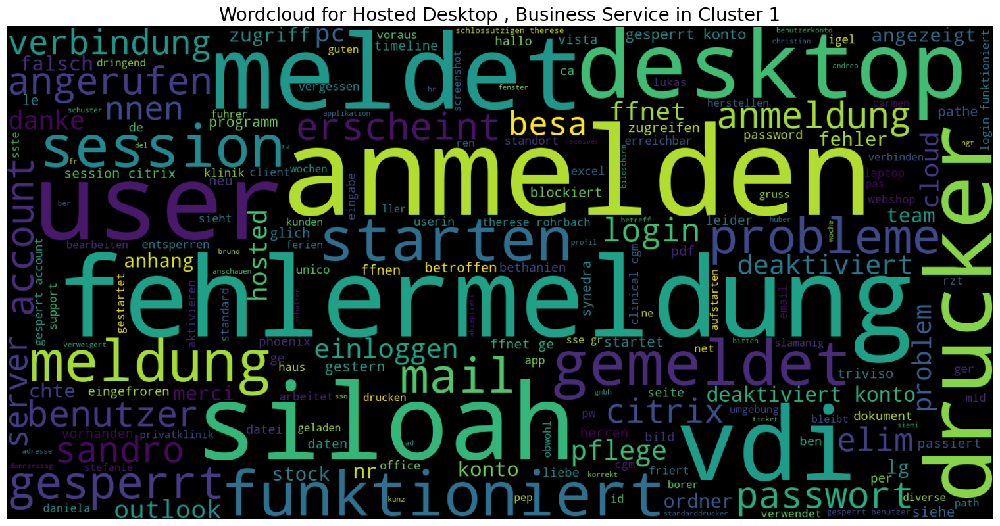

Cluster: 1 for BS:  Hosted Desktop


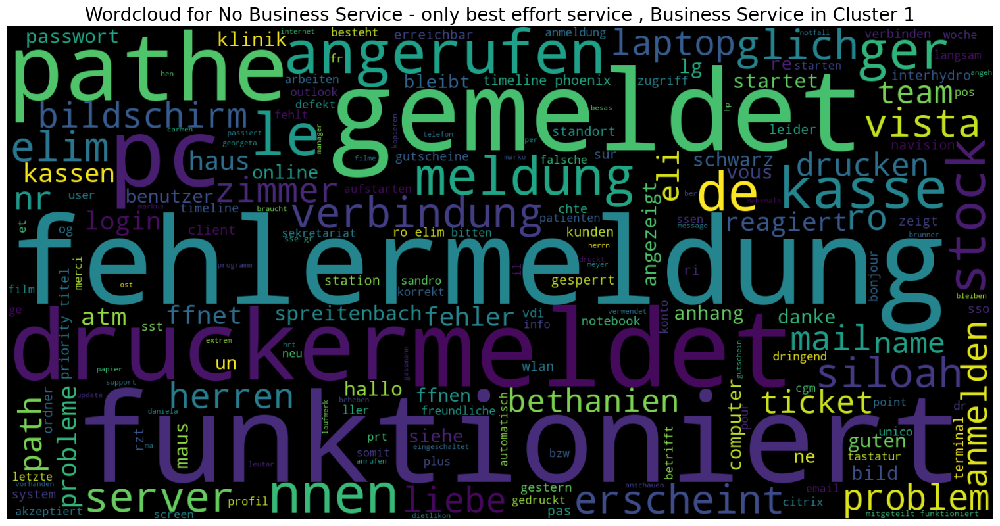

Cluster: 1 for BS:  No Business Service - only best effort service


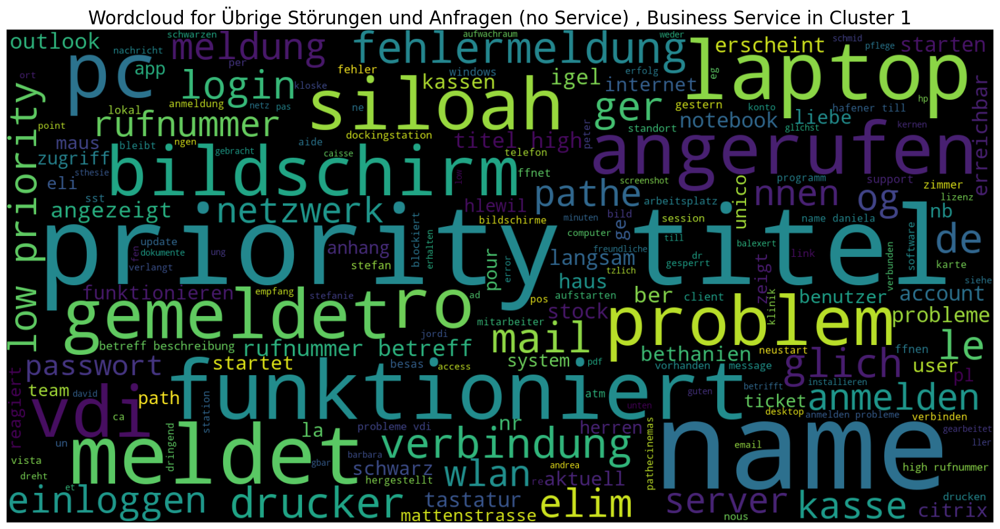

Cluster: 1 for BS:  Übrige Störungen und Anfragen (no Service)


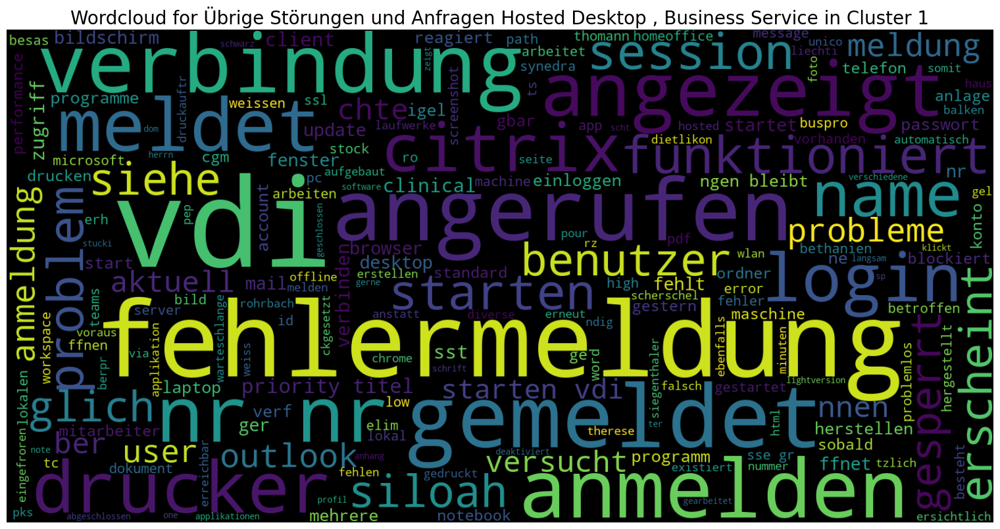

Cluster: 1 for BS:  Übrige Störungen und Anfragen Hosted Desktop


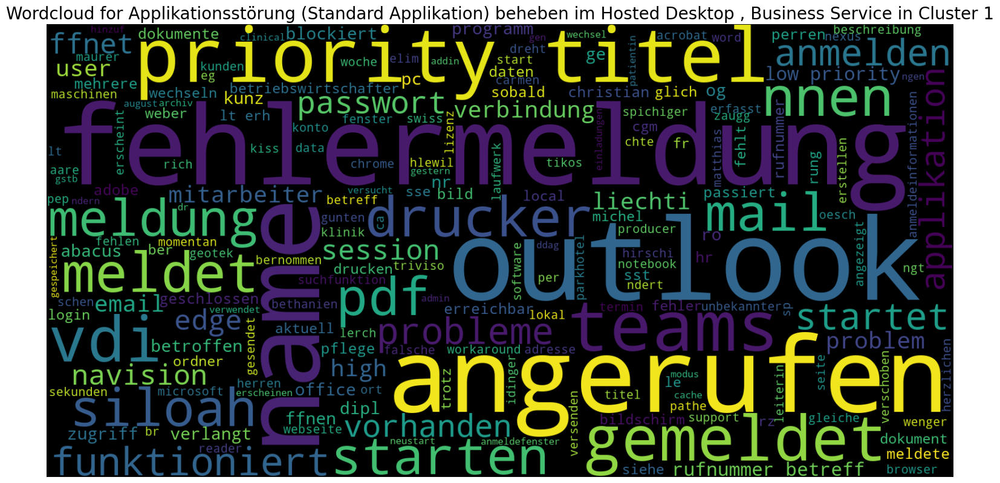

Cluster: 1 for BS:  Applikationsstörung (Standard Applikation) beheben im Hosted Desktop


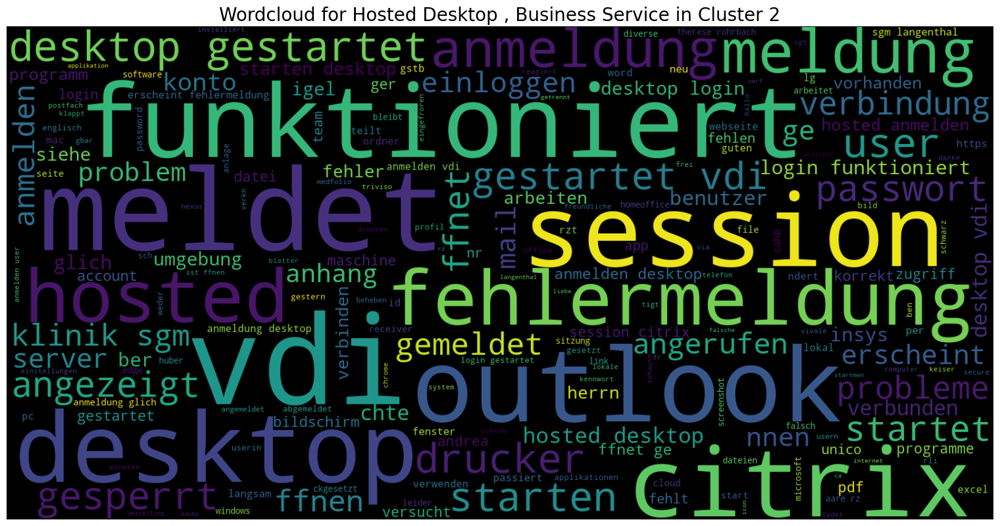

Cluster: 2 for BS:  Hosted Desktop


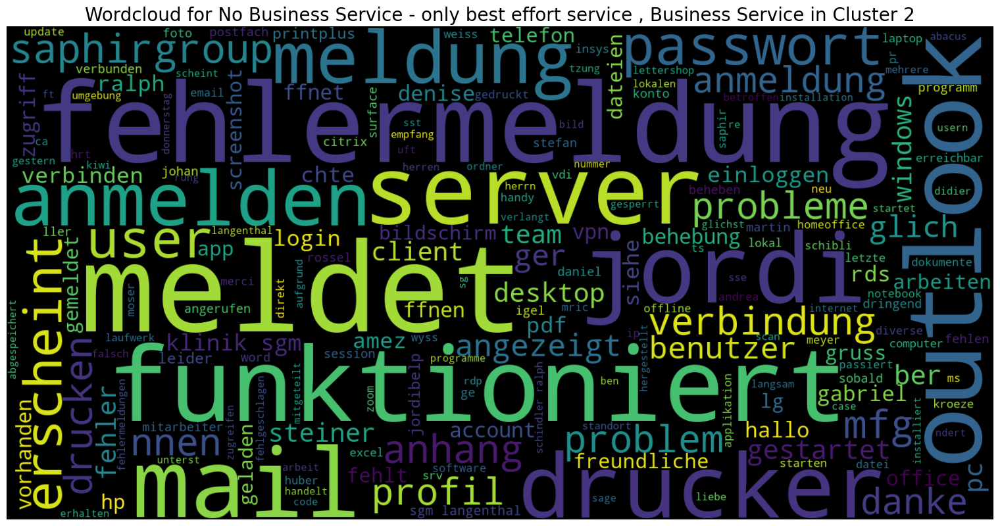

Cluster: 2 for BS:  No Business Service - only best effort service


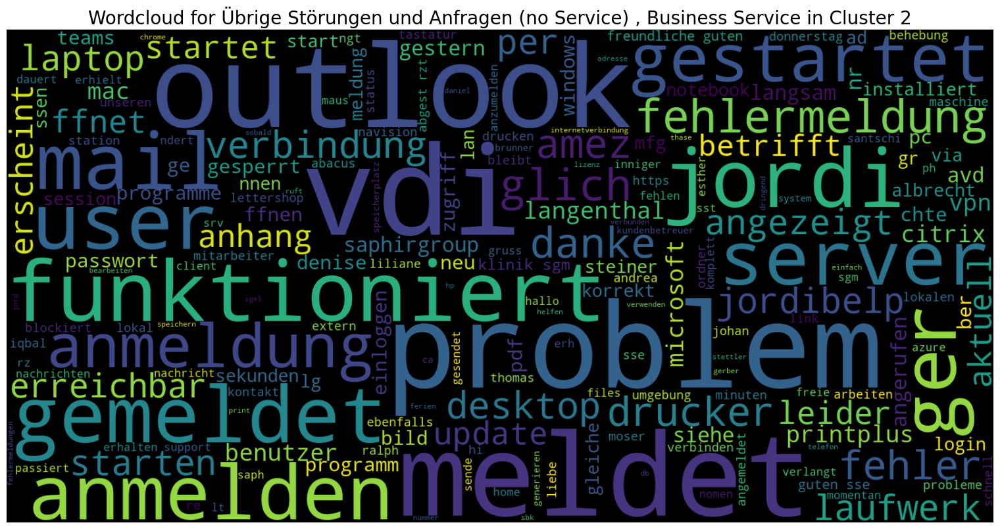

Cluster: 2 for BS:  Übrige Störungen und Anfragen (no Service)


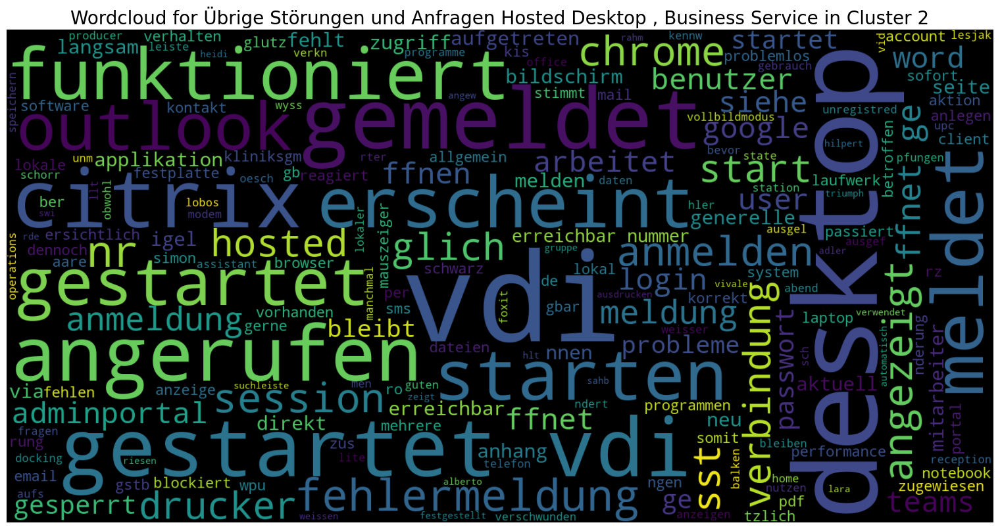

Cluster: 2 for BS:  Übrige Störungen und Anfragen Hosted Desktop


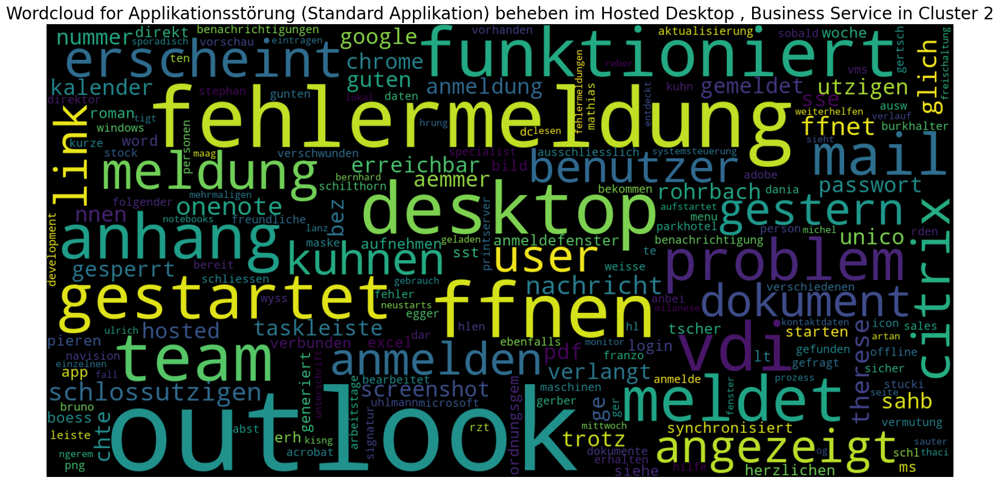

Cluster: 2 for BS:  Applikationsstörung (Standard Applikation) beheben im Hosted Desktop


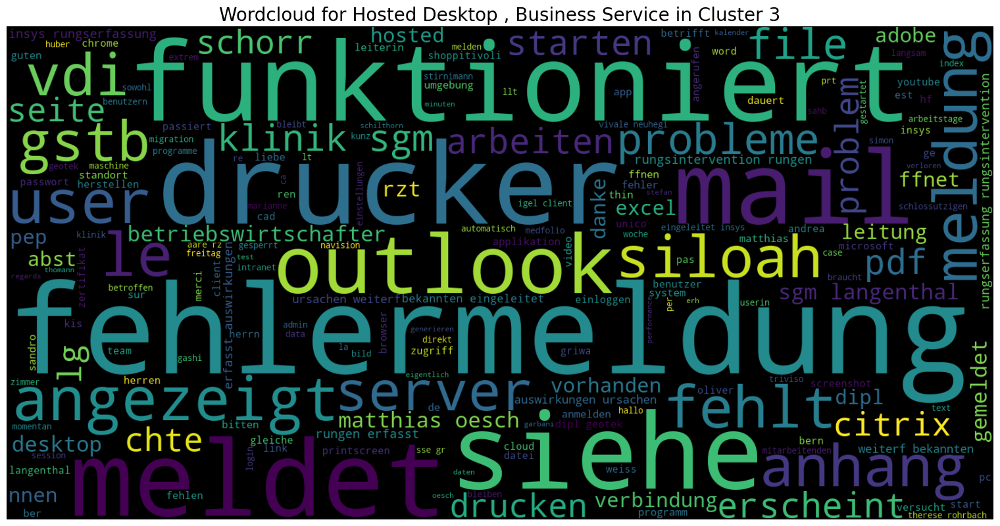

Cluster: 3 for BS:  Hosted Desktop


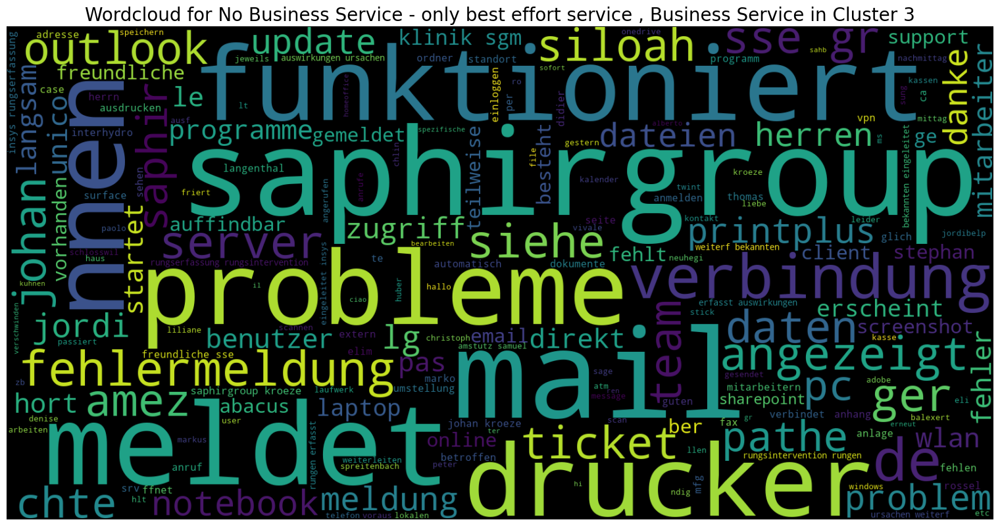

Cluster: 3 for BS:  No Business Service - only best effort service


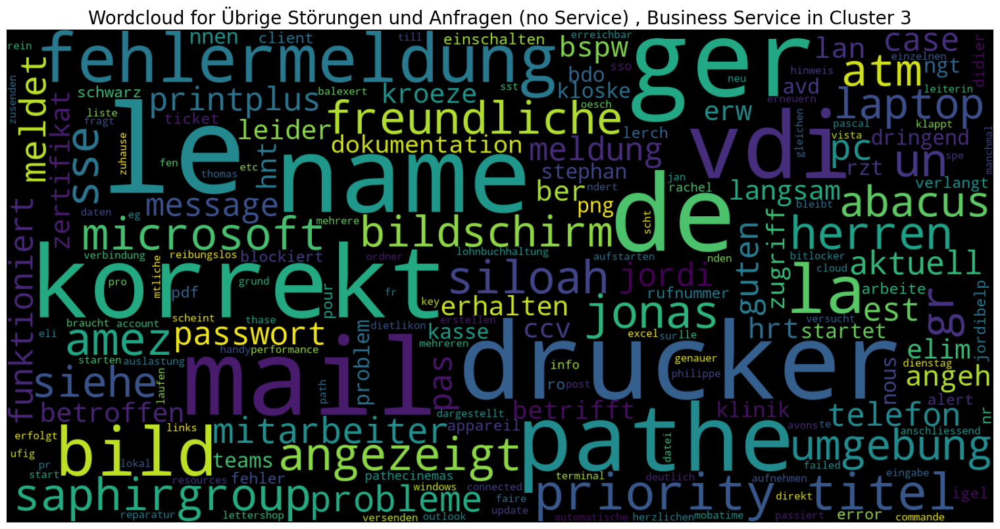

Cluster: 3 for BS:  Übrige Störungen und Anfragen (no Service)


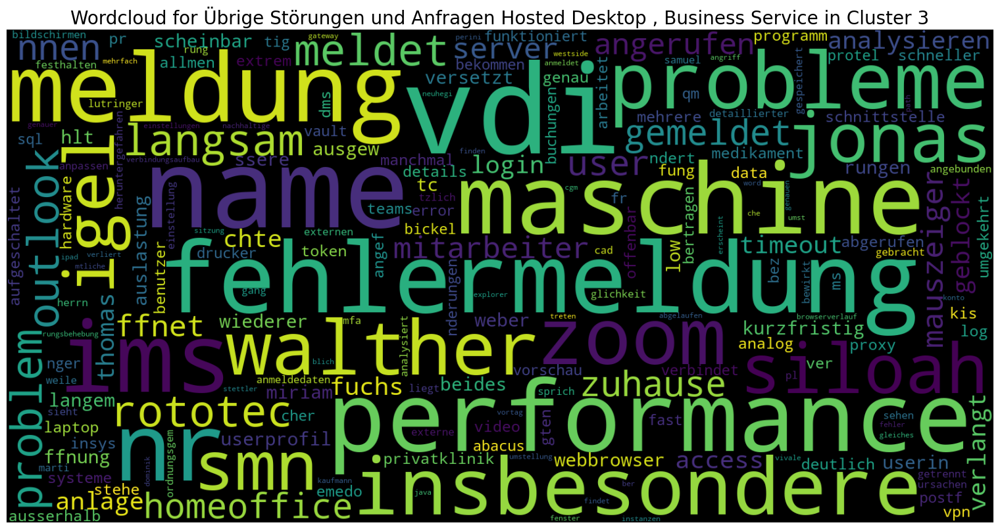

Cluster: 3 for BS:  Übrige Störungen und Anfragen Hosted Desktop


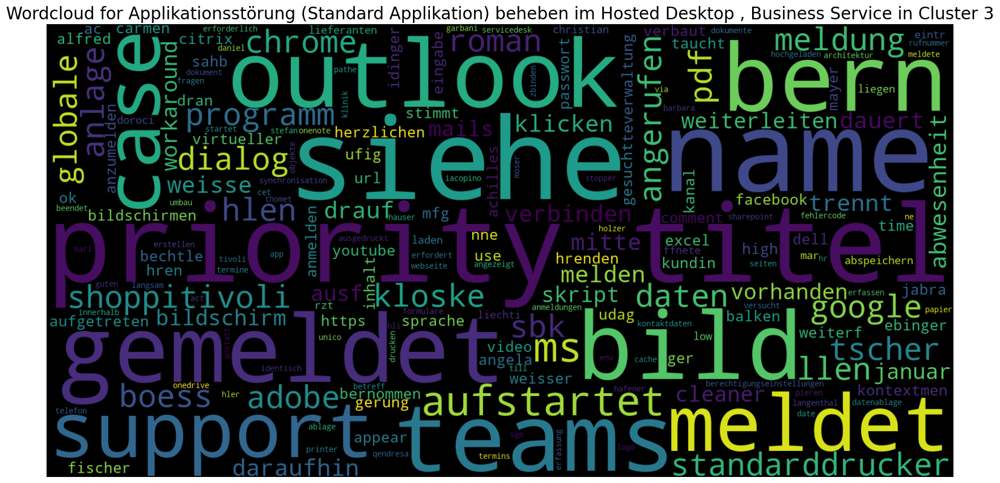

Cluster: 3 for BS:  Applikationsstörung (Standard Applikation) beheben im Hosted Desktop


In [19]:
def create_wordclouds(df, clusterFilter = None, businessServiceFilter = None, plot_worldcloud=False):
    '''
    param df: dataframe (df_enhance = pd.read_parquet('Daten/Top50Words_OneHot_DataFrame.parquet'))
    clusterFilter: int (example: "1")
    businessServiceFilter: string (example: "skype")
    plot_worldcloud: boolean (default: False)
    
    '''

    # create copy of df
    df_enhance = df.copy()

    # filter for Clusterfilter
    if clusterFilter != None:
        df_enhance = df_enhance[df_enhance["cluster"] == clusterFilter]
    else:
        pass

    # filter for serviceangebotfilter
    if businessServiceFilter != None:
        df_enhance = df_enhance[df_enhance["business_service"] == businessServiceFilter]
    else:
        pass
    

    # filter from df the top 10 words each ticket and turn into list 
    vorcab = np.array(df_enhance["top_10_words_each_ticket_description"].to_list()).reshape(-1, 1)

    # convert vorcab into DataFrame
    df_vorcab = pd.DataFrame(vorcab)
    # rename column from new created dataframe
    df_vorcab.columns = ["top_10_words_each_ticket_description"]

    # filter with regex, not numbers 
    df_vorcab = df_vorcab[(df_vorcab["top_10_words_each_ticket_description"].str.contains(r'[0-9]') == False)]
    # filter with regex, if none remove
    df_vorcab = df_vorcab[df_vorcab["top_10_words_each_ticket_description"] != "none"]

    worldclouds_list = df_vorcab["top_10_words_each_ticket_description"].to_list()  

    # create with worldclouds_list a string a worldcloud
    worldclouds_string = " ".join(worldclouds_list)

    # create wordcloud
    wordcloud = WordCloud(width=1600, height=800, max_font_size=200).generate(worldclouds_string)

    if plot_worldcloud:
        # plot wordcloud
        # set to white background
        # add title 

        plt.figure(figsize=(15,20), facecolor='white', edgecolor='blue')
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.title(f"Wordcloud for {businessServiceFilter} , Business Service in Cluster {clusterFilter}" , fontsize=20)
        plt.axis("off")
        plt.tight_layout(pad=0)
        plt.show()
        # save wordcloud as png
        # import re
        import re
        print(f"Cluster: {clusterFilter} for BS:  {businessServiceFilter}")
        # replace everhy non character with _ in serviceangebotfilter
        businessServiceFilter_string = re.sub(r'\W+', '', businessServiceFilter)
        wordcloud.to_file(f"wordcloud/Cluster{clusterFilter}_{businessServiceFilter_string}.png")


print("Top20 words for business_service")
df_enhance.business_service.value_counts().reset_index().iloc[:5, 0].to_list()

# iterate through top 20 serviceangebot
for cluster in df_enhance.cluster.value_counts().reset_index().iloc[:7, 0].to_list():
    for business_service in df_enhance.business_service.value_counts().reset_index().iloc[:5, 0].to_list():
        create_wordclouds(df_enhance, clusterFilter=cluster, businessServiceFilter=business_service, plot_worldcloud=True)
        # export wordclouds as png  

In [29]:
test = str(df.cluster[0])
print(type(test))
print(str(df.cluster[:10]))

<class 'str'>
0    1
1    1
2    1
3    1
4    4
5    1
6    4
7    4
8    4
9    4
Name: cluster, dtype: int32
